In [1]:
import resiliencyTool as rt
import pandas as pd
# import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from pandapower.plotting.plotly import simple_plotly, vlevel_plotly, pf_res_plotly

In [2]:
simulationName = 'example_1';
network = rt.network.Network(simulationName);
simulation = rt.simulation.Sim(simulationName);
# simulation.time = rt.simulation.Time(start = 11, duration = 3)

c:\users\fbk106\documents\repositories\resiliencytool\resiliencyTool\network.py:808: UserWarning: Input parameter "longitude" unknown in {'id': 'bus1', 'vn_kv': 220, 'longitude': 81.4, 'latitude': 9.5, 'in_service': True, 'delta x': 1.0, 'delta y': 1.0} .
  warnings.warn(f'Input parameter "{key}" unknown in {kwargs} .')
c:\users\fbk106\documents\repositories\resiliencytool\resiliencyTool\network.py:808: UserWarning: Input parameter "latitude" unknown in {'id': 'bus1', 'vn_kv': 220, 'longitude': 81.4, 'latitude': 9.5, 'in_service': True, 'delta x': 1.0, 'delta y': 1.0} .
  warnings.warn(f'Input parameter "{key}" unknown in {kwargs} .')
c:\users\fbk106\documents\repositories\resiliencytool\resiliencyTool\network.py:808: UserWarning: Input parameter "delta x" unknown in {'id': 'bus1', 'vn_kv': 220, 'longitude': 81.4, 'latitude': 9.5, 'in_service': True, 'delta x': 1.0, 'delta y': 1.0} .
  warnings.warn(f'Input parameter "{key}" unknown in {kwargs} .')
c:\users\fbk106\documents\repositorie

start= 1, stop= 41
start= 12, stop= 17


In [5]:
simulation.time = rt.simulation.Time(start = 13, duration = 1)
simulation.run(network, delta = 1e-16, iterationSet=[2], saveOutput = False)

start= 13, stop= 14
Iteration = 2
in_service
max_p_mw


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.25s/it]


in_service
max_p_mw


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


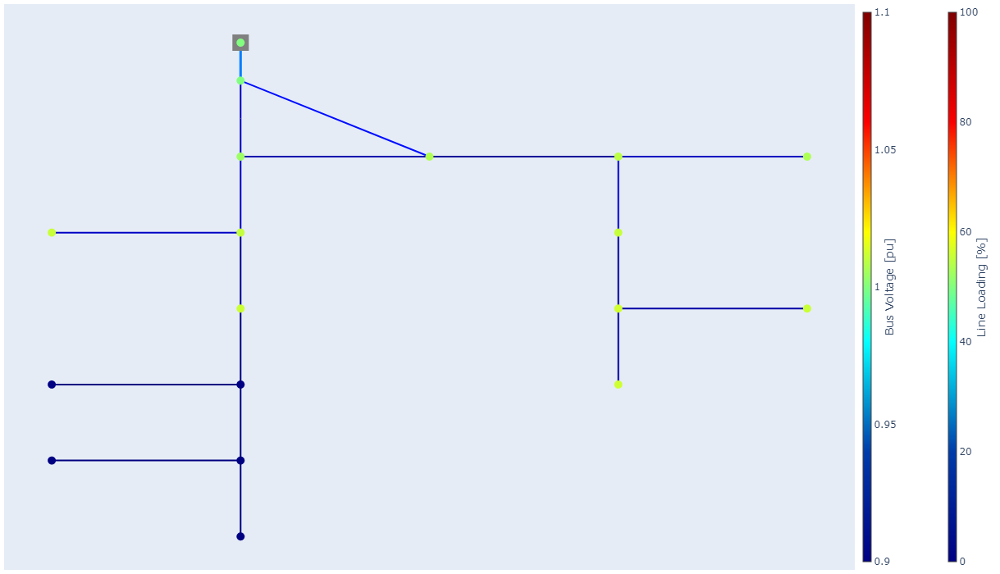

In [6]:
pf_res_plotly(network.pp_network);

In [24]:
df = pd.read_csv(rt.config.path.engineDatabaseFile(simulationName), index_col = [0, 1, 2, 3])
df.drop(index = 'network', level = 'id', inplace = True)
df

2022-01-01 01:00:00  \
iteration field             type id                            
0         vm_pu             bus  bus1               1.000000   
                                 bus2               0.999998   
                                 bus3               1.001496   
                                 bus4               1.010099   
                                 bus5               1.013052   
...                                                      ...   
99        loss_of_load_p_mw load load6              0.000026   
                                 load9              0.000026   
                                 load11             0.000026   
                                 load14             0.000026   
                                 load17             0.000026   

                                         2022-01-01 02:00:00  \
iteration field             type id                            
0         vm_pu             bus  bus1               1.000000   
                                 bus2               0.999901   
                                 bus3               1.000738   
                                 bus4               1.005545   
                                 bus5               1.007832   
...                                                      ...   
99        loss_of_load_p_mw load load6              0.000129   
                                 load9              0.000129   
                                 load11             0.000130   
                                 load14             0.000129   
                                 load17             0.000129   

                                         2022-01-01 03:00:00  \
iteration field             type id                            
0         vm_pu             bus  bus1               1.000000   
                                 bus2               0.999732   
                                 bus3               1.004076   
                                 bus4               1.004345   
                                 bus5               1.003898   
...                                                      ...   
99        loss_of_load_p_mw load load6              0.000099   
                                 load9              0.000099   
                                 load11             0.000099   
                                 load14             0.000099   
                                 load17             0.000099   

                                         2022-01-01 04:00:00  \
iteration field             type id                            
0         vm_pu             bus  bus1               1.000000   
                                 bus2               0.999096   
                                 bus3               1.007530   
                                 bus4               1.008218   
                                 bus5               1.009362   
...                                                      ...   
99        loss_of_load_p_mw load load6              0.000023   
                                 load9              0.000023   
                                 load11             0.000023   
                                 load14             0.000023   
                                 load17             0.000023   

                                         2022-01-01 05:00:00  \
iteration field             type id                            
0         vm_pu             bus  bus1               1.000000   
                                 bus2               0.999357   
                                 bus3               1.008512   
                                 bus4               1.008620   
                                 bus5               1.011183   
...                                                      ...   
99        loss_of_load_p_mw load load6              0.000021   
                                 load9              0.000021   
                                 load11             0.000021   
     

In [22]:
content = df.loc[:, 'loss_of_load_p_mw','load',:] / df.loc[:, 'max_p_mw','load',:] *100
aux = pd.concat({('loss_of_load_percentage', 'load') : content}, names=['field', 'type'], axis=0)
content


2022-01-01 01:00:00  2022-01-01 02:00:00  \
iteration id                                                 
0         load1              0.000054             0.000412   
          load2              0.000039             0.000336   
          load3              0.001978             0.016289   
          load6              0.000620             0.004196   
          load9              0.006679             0.001448   
...                               ...                  ...   
99        load6              0.000620             0.004196   
          load9              0.006679             0.001448   
          load11             0.000363             0.013104   
          load14             0.000699             0.002495   
          load17             0.000461             0.007083   

                  2022-01-01 03:00:00  2022-01-01 04:00:00  \
iteration id                                                 
0         load1              0.000313             0.000047   
          load2              0.000721             0.000198   
          load3              0.001678             0.006123   
          load6              0.001059             0.000373   
          load9              0.004698             0.000358   
...                               ...                  ...   
99        load6              0.001059             0.000373   
          load9              0.004698             0.000358   
          load11             0.001503             0.000345   
          load14             0.003274             0.000821   
          load17             0.003155             0.000945   

                  2022-01-01 05:00:00  2022-01-01 06:00:00  \
iteration id                                                 
0         load1              0.000040             0.000154   
          load2              0.000111             0.000058   
          load3              0.000224             0.000524   
          load6              0.000570             0.000822   
          load9              0.000564             0.000422   
...                               ...                  ...   
99        load6              0.000570             0.000822   
          load9              0.000564             0.000422   
          load11             0.000374             0.000460   
          load14             0.000297             0.013657   
          load17             0.001222             0.000606   

                  2022-01-01 07:00:00  2022-01-01 08:00:00  \
iteration id                                                 
0         load1              0.000402             0.000331   
          load2              0.000392             0.001500   
          load3              0.001644             0.001089   
          load6              0.005610             0.003613   
          load9              0.002056             0.007381   
...                               ...                  ...   
99        load6              0.005610             0.003613   
          load9              0.002056             0.007381   
          load11             0.003115             0.002320   
          load14             0.007327             0.001662   
          load17             0.003065             0.010029   

                  2022-01-01 09:00:00  2022-01-01 10:00:00  ...  \
iteration id                                                ...   
0         load1              0.000162             0.000093  ...   
          load2              0.000089             0.000238  ...   
          load3              0.003071             0.001107  ...   
          load6              0.002141             0.000699  ...   
          load9              0.001043             0.000654  ...   
...                               ...                  ...  ...   
99        load6              0.002141             0.000699  ...   
          load9              0.001043             0.000654  ...   
          load11             0.014477             0.003652  ...   
          load14             0.000965             0.0

In [9]:
# idx = pd.IndexSlice
def percenties():

def invert(df):
    aux_ = list(set(df.index.names)-{'field'})
    return df.unstack(level = aux_).T.reset_index(level = aux_)
    
def filter(df, **kwargs):
    filter = True
    for k,v in kwargs.items():
        filter = filter & (df.index.get_level_values(level = k) == v)
    return df.loc[filter]

def group_by(df, operation = 'sum', *args):
    if operation == 'sum':
        return df.groupby(level = args).sum()
    elif operation == 'mean':
        return df.groupby(level = args).mean()
    else:
        return df

In [31]:
# df_ = filter(df, field = 'loss_of_load_p_mw', type = 'load')
# df_ = group_by(df_, 'sum', 'iteration', 'field', 'type')
# df_1 = invert(df_)
df_load = group_by(filter(df, type = 'load'), 'sum', 'iteration', 'field', 'type')
df_load = invert(df_load)
df_load['loss_of_load_p_percentage'] = (df_load['loss_of_load_p_mw'])/df_load['max_p_mw'] *100
df_load.loc['2022-01-01 13:00:00']



field,iteration,type,in_service,loss_of_load_p_mw,max_p_mw,max_q_mvar,p_mw,q_mvar,loss_of_load_p_percentage
2022-01-01 13:00:00,0,load,8.0,0.000251,102.027394,0.0,102.027143,-8.000000e-16,0.000246
2022-01-01 13:00:00,1,load,8.0,4.497948,102.027394,0.0,97.529446,-6.000000e-16,4.408569
2022-01-01 13:00:00,2,load,8.0,4.497004,102.027394,0.0,97.530390,-8.000000e-16,4.407644
2022-01-01 13:00:00,3,load,8.0,4.497931,102.027394,0.0,97.529463,-6.000000e-16,4.408552
2022-01-01 13:00:00,4,load,8.0,0.000082,102.027394,0.0,102.027313,-8.000000e-16,0.000080
...,...,...,...,...,...,...,...,...,...
2022-01-01 13:00:00,95,load,8.0,4.497924,102.027394,0.0,97.529470,-6.000000e-16,4.408546
2022-01-01 13:00:00,96,load,8.0,4.497004,102.027394,0.0,97.530390,-8.000000e-16,4.407644
2022-01-01 13:00:00,97,load,8.0,0.000124,102.027394,0.0,102.027270,-8.000000e-16,0.000122
2022-01-01 13:00:00,98,load,8.0,4.569069,102.027394,0.0,97.458325,-6.000000e-16,4.478277


In [26]:
# df_filtered = df.loc[:,:,'load','network']
# df_filtered = df_filtered.unstack(level = list(set(df_filtered.index.names)-{'field'})).T.reset_index(level = 'iteration')
# df_= df.unstack(level = list(set(df.index.names)-{'field'})).T.reset_index()
# df.unstack(level = list(set(df.index.names)-{'field'})).T.reset_index()

In [25]:
# df_filtered

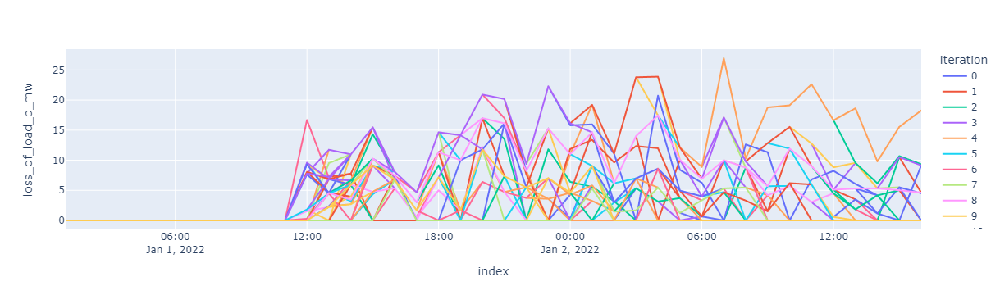

In [11]:
# fig = px.line(df_filtered, x=df_filtered.index, y = 'loss_of_load_p_mw', )
fig = px.line(df_load, x=df_load.index, y = 'loss_of_load_p_mw', color = 'iteration')
# px.line(df_filtered, x=df_filtered.index, y = 'p_mw')
fig.show()


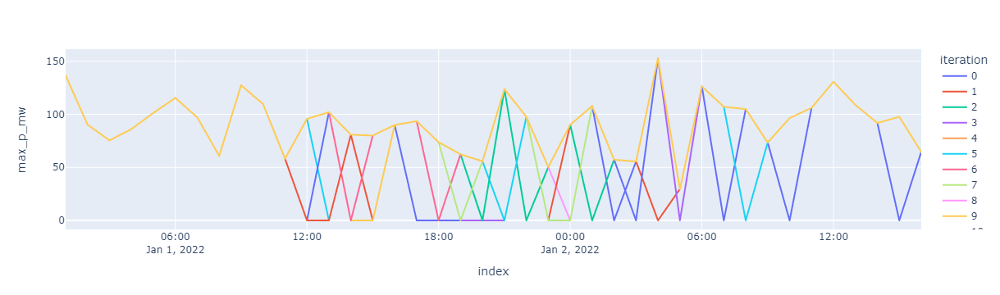

In [27]:
fig = px.line(df_load, x=df_load.index, y = 'max_p_mw', color = 'iteration')
fig.show()

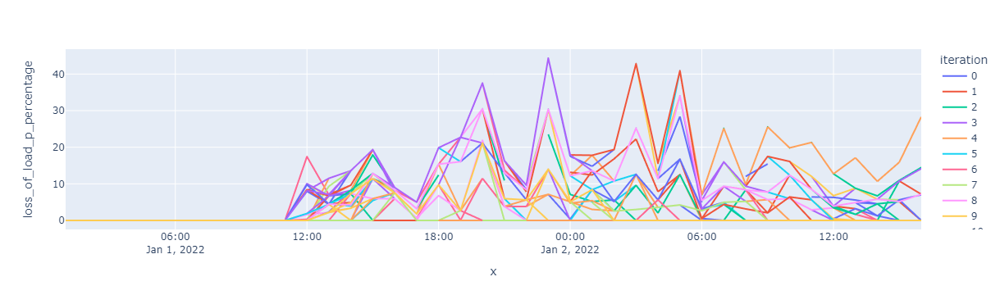

In [222]:
fig = px.line(df_load, x=df_filtered.index, y = 'loss_of_load_p_percentage', color = 'iteration')
fig.show()

In [223]:
df_line = group_by(filter(df, type = 'line'), 'sum', 'iteration', 'field', 'type')
df_line = invert(df_line)
df_line
# df_load['loss_of_load_p_percentage'] = (df_load['loss_of_load_p_mw'])/df_load['max_p_mw'] *100
# df_load

field,iteration,type,i_ka,in_service,loading_percent,pl_mw,ql_mvar
2022-01-01 01:00:00,0,line,0.519508,17.0,110.533651,0.586450,-26.881568
2022-01-01 01:00:00,1,line,0.519508,17.0,110.533651,0.586450,-26.881568
2022-01-01 01:00:00,2,line,0.519508,17.0,110.533651,0.586450,-26.881568
2022-01-01 01:00:00,3,line,0.519508,17.0,110.533651,0.586450,-26.881568
2022-01-01 01:00:00,4,line,0.519508,17.0,110.533651,0.586450,-26.881568
...,...,...,...,...,...,...,...
2022-01-02 16:00:00,95,line,0.380942,17.0,81.051510,0.258877,-27.078531
2022-01-02 16:00:00,96,line,0.380942,17.0,81.051510,0.258877,-27.078531
2022-01-02 16:00:00,97,line,0.380942,17.0,81.051510,0.258877,-27.078531
2022-01-02 16:00:00,98,line,0.350710,15.0,74.619220,0.247894,-23.580273


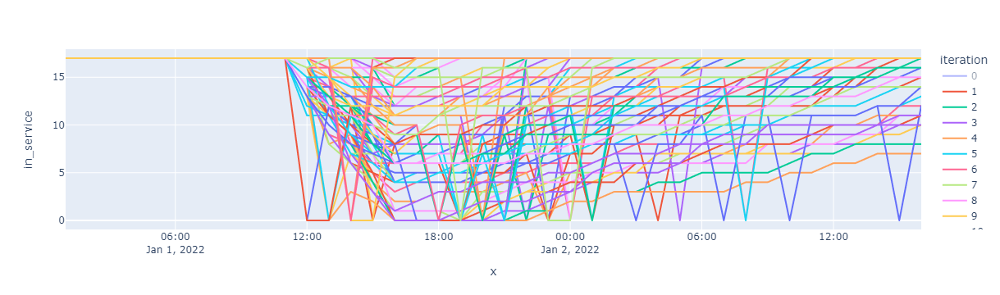

In [224]:
fig = px.line(df_line, x=df_filtered.index, y = 'in_service', color = 'iteration')
fig.show()

In [34]:
df_load = invert(filter(df, type = 'load'))
df_load['loss_of_load_p_percentage'] = (df_load['loss_of_load_p_mw'])/df_load['max_p_mw'] *100
df_load['load_supply_p_percentage'] = (df_load['max_p_mw']- df_load['loss_of_load_p_mw'])/df_load['max_p_mw'] *100
df_load.loc['2022-01-01 11:00:00']

field,iteration,id,type,p_mw,q_mvar,max_p_mw,max_q_mvar,in_service,loss_of_load_p_mw,loss_of_load_p_percentage,load_supply_p_percentage
2022-01-01 11:00:00,0,load1,load,28.480675,-1.000000e-16,28.480731,0.0,1.0,0.000056,0.000196,99.999804
2022-01-01 11:00:00,0,load2,load,4.375362,-1.000000e-16,4.375418,0.0,1.0,0.000056,0.001277,99.998723
2022-01-01 11:00:00,0,load3,load,7.373486,-1.000000e-16,7.373541,0.0,1.0,0.000056,0.000757,99.999243
2022-01-01 11:00:00,0,load6,load,0.445127,-1.000000e-16,0.445183,0.0,1.0,0.000056,0.012662,99.987338
2022-01-01 11:00:00,0,load9,load,5.013594,-1.000000e-16,5.013650,0.0,1.0,0.000056,0.001114,99.998886
...,...,...,...,...,...,...,...,...,...,...,...
2022-01-01 11:00:00,99,load6,load,0.445127,-1.000000e-16,0.445183,0.0,1.0,0.000056,0.012662,99.987338
2022-01-01 11:00:00,99,load9,load,5.013594,-1.000000e-16,5.013650,0.0,1.0,0.000056,0.001114,99.998886
2022-01-01 11:00:00,99,load11,load,3.623195,-1.000000e-16,3.623251,0.0,1.0,0.000056,0.001542,99.998458
2022-01-01 11:00:00,99,load14,load,5.979474,-1.000000e-16,5.979529,0.0,1.0,0.000056,0.000934,99.999066


In [264]:
# fig = px.scatter_matrix(df_load, dimensions=['loss_of_load_p_percentage','id'],color = 'iteration')
# fig.update_traces(diagonal_visible=False)
# fig.show()

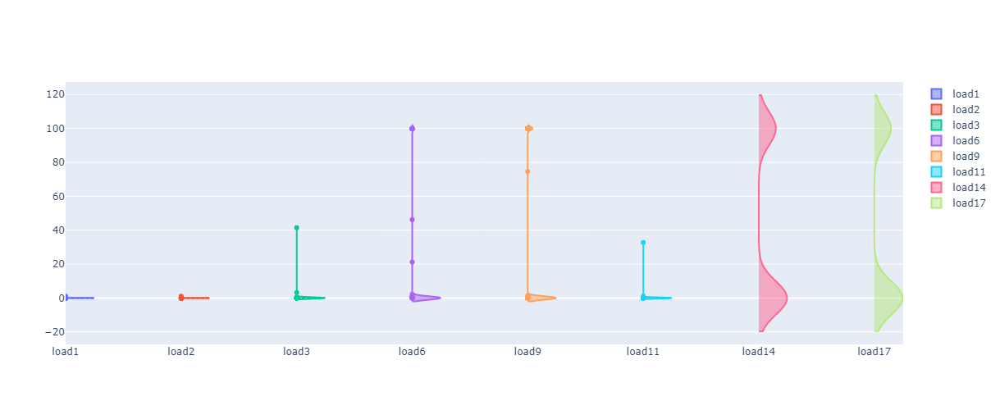

In [284]:
fig = go.Figure()

ids = df_load['id'].drop_duplicates().to_list()

for id in ids:
    fig.add_trace(go.Violin(x=df_load['id'][df_load['id'] == id],
                            y=df_load['loss_of_load_p_percentage'][df_load['id'] == id],
                            name=id,
                            box_visible=False,
                            meanline_visible=True,
                            side='positive'
                           )
                 
                 )
fig.update_layout(height=500)
fig.show()

In [271]:
df_line = group_by(filter(df, field = 'loading_percent', type = 'line'), 'mean', 'iteration', 'field','id')
df_line = invert(df_line)
df_line

field,iteration,id,loading_percent
2022-01-01 01:00:00,0,line1,2.466783
2022-01-01 01:00:00,0,line10,9.892563
2022-01-01 01:00:00,0,line11,10.551646
2022-01-01 01:00:00,0,line12,4.145094
2022-01-01 01:00:00,0,line13,2.329593
...,...,...,...
2022-01-02 16:00:00,99,line5,10.130726
2022-01-02 16:00:00,99,line6,7.360623
2022-01-02 16:00:00,99,line7,2.583188
2022-01-02 16:00:00,99,line8,1.696699


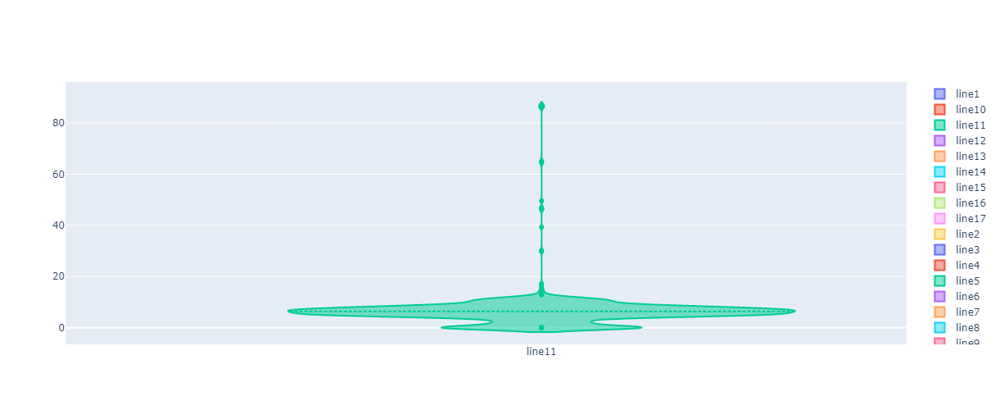

In [281]:
fig = go.Figure()

ids = df_line['id'].drop_duplicates().to_list()

for id in ids:
    fig.add_trace(go.Violin(x=df_line['id'][df_line['id'] == id],
                            y=df_line['loading_percent'][df_line['id'] == id],
                            name=id,
                            box_visible=False,
                            meanline_visible=True,
                            # side='positive'
                           )
                 
                 )
fig.update_layout(height=500)
fig.show()